# Task 1: Linear Regression with Non-Linear Basis Function

In [ ]:
import numpy as np
import pandas as pd
import itertools
import matplotlib.pyplot as plt
from sklearn.utils import check_random_state
from sklearn.metrics import mean_squared_error

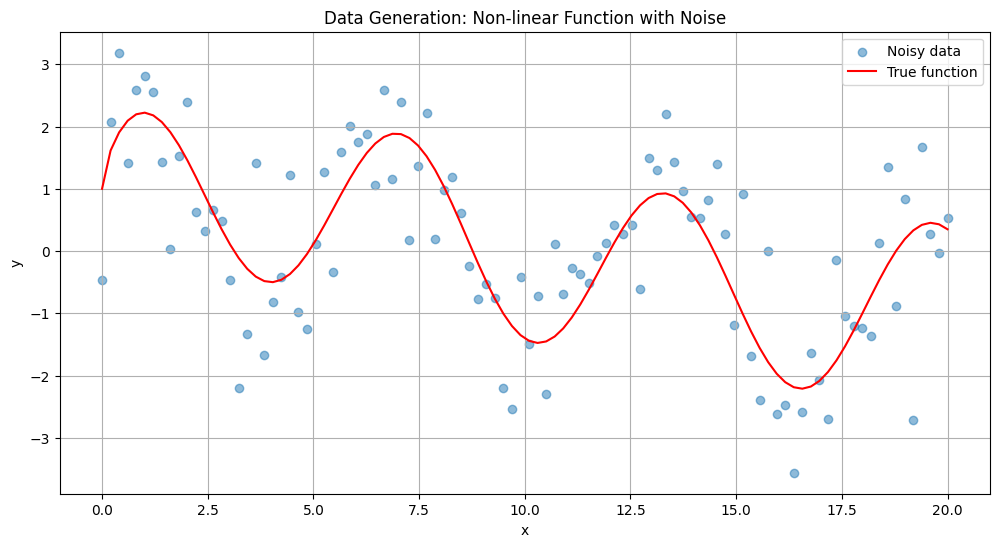

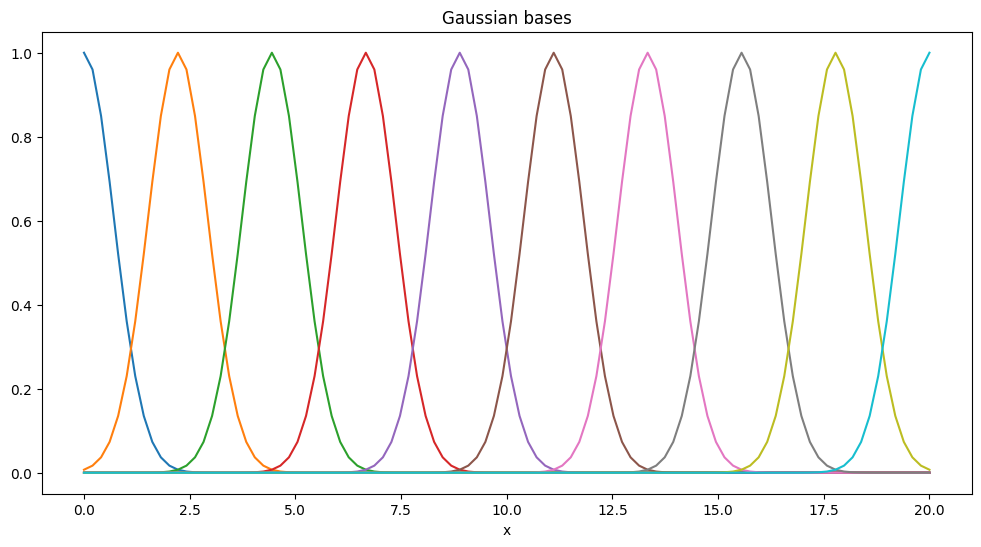

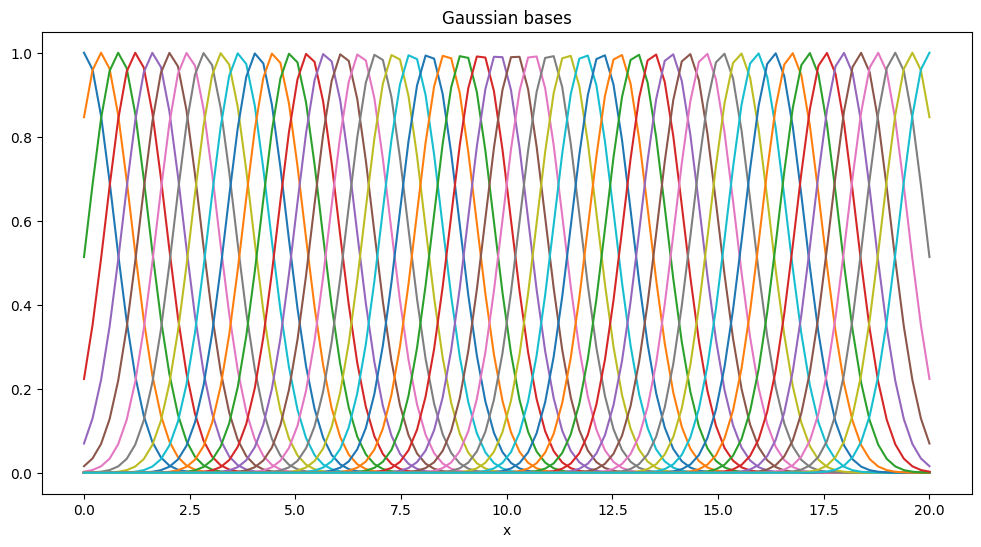

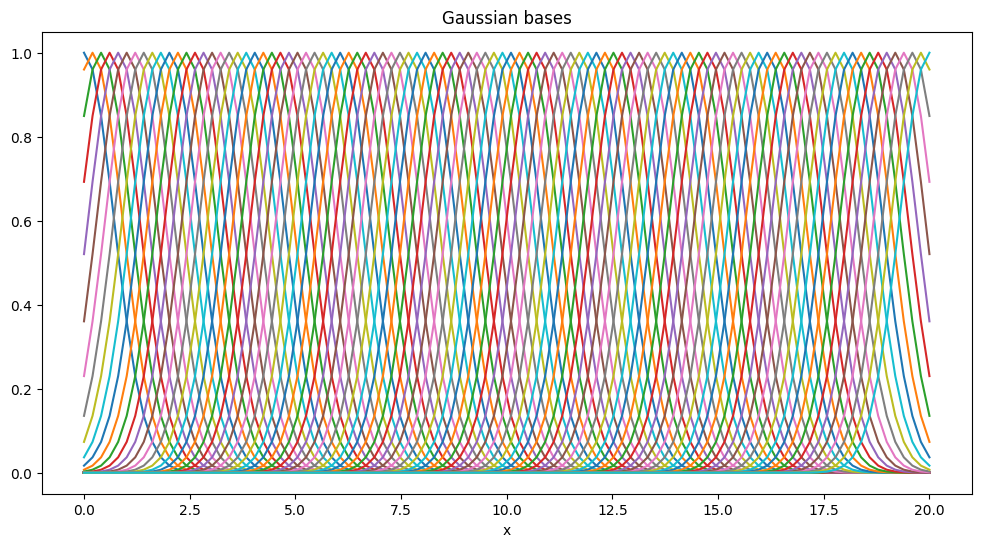

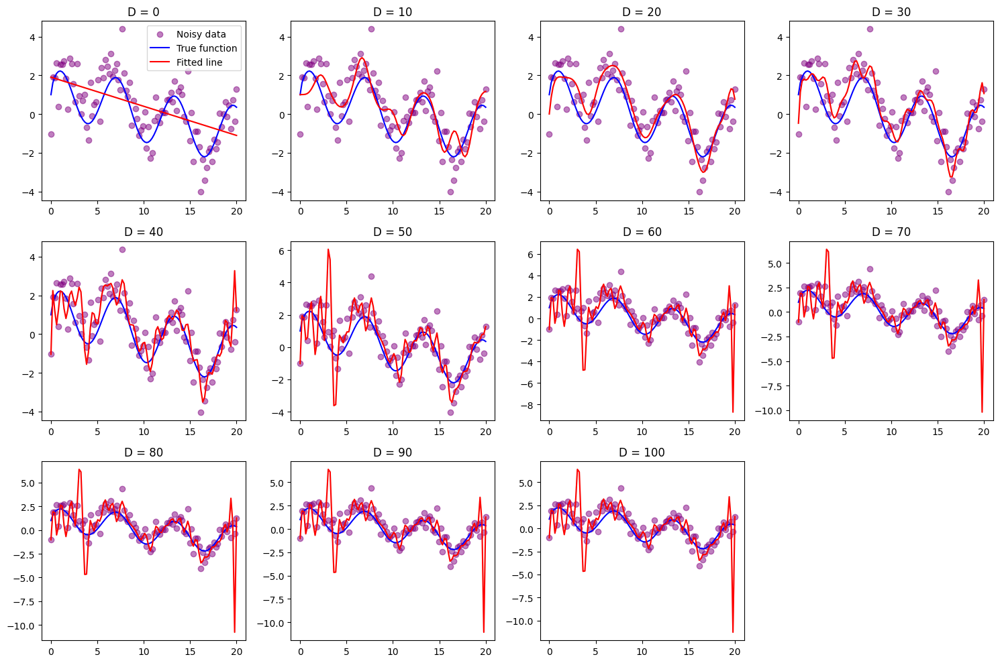

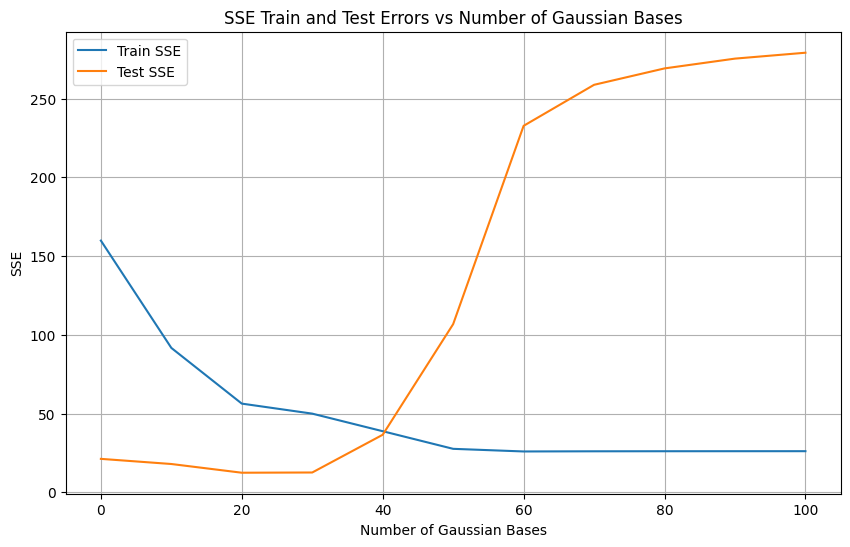

Optimal number of Gaussian basis functions: 20


In [ ]:

import numpy as np
import sklearn
from sklearn.metrics import mean_squared_error
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

class LinearRegression:
    def __init__(self, add_bias=True):
        self.add_bias = add_bias
        self.w = None

    def fit(self, x, y):
        if x.ndim == 1:
            x = x[:, None]
        N = x.shape[0]
        if self.add_bias:
            x = np.column_stack([x, np.ones(N)])
        x_transpose = np.transpose(x)
        self.w = np.linalg.pinv(x_transpose @ x) @ x_transpose @ y
        return self

    def predict(self, x):
        if x.ndim == 1:
            x = x[:, None]
        N = x.shape[0]
        if self.add_bias:
            x = np.column_stack([x, np.ones(N)])
        yh = x @ self.w
        return yh


x = np.linspace(0, 20, 100)
y = np.sin(np.sqrt(x)) + np.cos(x) + np.sin(x)
noise = np.random.normal(0, 1, 100)
y_noisy = y + noise
df = pd.DataFrame({'x': x, 'y': y, 'y_noisy': y_noisy})

# plotting true function with points to show noise
plt.figure(figsize=(12, 6))
plt.scatter(df['x'], df['y_noisy'], alpha=0.5, label='Noisy data')
plt.plot(df['x'], df['y'], color='red', label='True function')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Data Generation: Non-linear Function with Noise')
plt.legend()
plt.grid(True)
plt.show()

#plotting 10, 50, & 100 gaussian basis functions
for i in [10, 50, 100]:
    plt.figure(figsize=(12, 6))
    D=i
    gaussian = lambda x,mu,sigma: np.exp(-((x-mu)/sigma)**2)
    mu = np.linspace(0,20,D)
    phi = gaussian(x[:,None], mu[None,:],1)
    for d in range(D):
        plt.plot(x, phi[:,d], '-')
    plt.xlabel('x')
    plt.title('Gaussian bases')
    plt.show()

#----------------TASK 1

def generate_data():
    x = np.linspace(0, 20, 100)
    y = np.sin(np.sqrt(x)) + np.cos(x) + np.sin(x)
    y_noisy = y + np.random.normal(0, 1, 100)
    return x, y, y_noisy

def create_gaussian_features(x, D):
    if D == 0:
        return x[:, None]
    mu = np.linspace(0, 20, D)
    return np.exp(-1 * ((x[:, None] - mu) / 1) ** 2) #sigma stdev of 1

def compute_sse(y_true, y_pred):
    return np.sum((y_true - y_pred) ** 2)

D_values = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
all_train_errors = []
all_test_errors = []
all_fits = {D: [] for D in D_values}

x, y_true, y_noisy = generate_data()
x_train, x_test, y_train, y_test = train_test_split(x, y_noisy, test_size=0.2)

train_errors = []
test_errors = []

for D in D_values: #using 10-100 gaussian bases
        phi_train = create_gaussian_features(x_train, D)
        phi_test = create_gaussian_features(x_test, D)

        model = LinearRegression()
        model.fit(phi_train, y_train)

        y_train_pred = model.predict(phi_train)
        y_test_pred = model.predict(phi_test)

        train_errors.append(compute_sse(y_train, y_train_pred))
        test_errors.append(compute_sse(y_test, y_test_pred))

        #storing full fit for plotting later
        phi_full = create_gaussian_features(x, D)
        all_fits[D].append(model.predict(phi_full))

        all_train_errors.append(train_errors)
        all_test_errors.append(test_errors)

# plotting
plt.figure(figsize=(15, 10))
for i, D in enumerate(D_values):
    plt.subplot(3, 4, i+1)
    plt.scatter(x, y_noisy, alpha=0.5, label='Noisy data', color='purple')
    for fit in all_fits[D]:
        plt.plot(x, fit, 'g-', alpha=0.1)
    plt.plot(x, y_true, 'b-', label='True function')
    plt.plot(x, np.mean(all_fits[D], axis=0), 'r-', label='Fitted line')
    plt.title(f'D = {D}')
    if i == 0:
        plt.legend()
plt.tight_layout()
plt.show()

# plotting train and test errors
plt.figure(figsize=(10, 6))
plt.plot(D_values, np.mean(all_train_errors, axis=0), label='Train SSE')
plt.plot(D_values, np.mean(all_test_errors, axis=0), label='Test SSE')
plt.xlabel('Number of Gaussian Bases')
plt.ylabel('SSE')
plt.title('SSE Train and Test Errors vs Number of Gaussian Bases')
plt.legend()
plt.grid(True)
plt.show()

# optimal number of bases
optimal_D = D_values[np.argmin(np.mean(all_test_errors, axis=0))]
print(f'Optimal number of Gaussian basis functions: {optimal_D}')

# Task 2: Bias-Variance Tradeoff with Multiple Fits ##


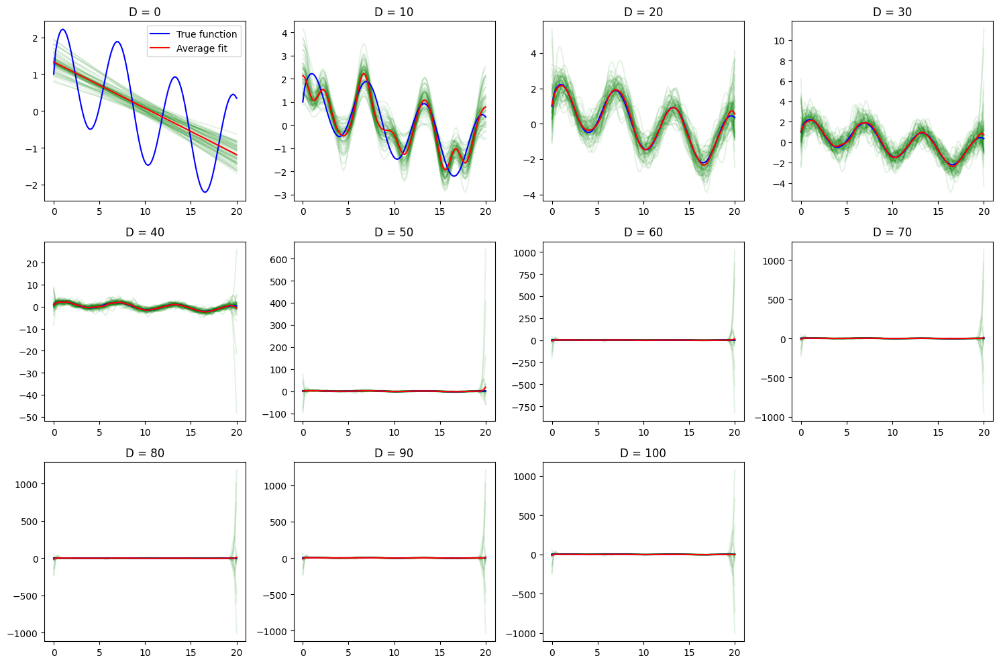

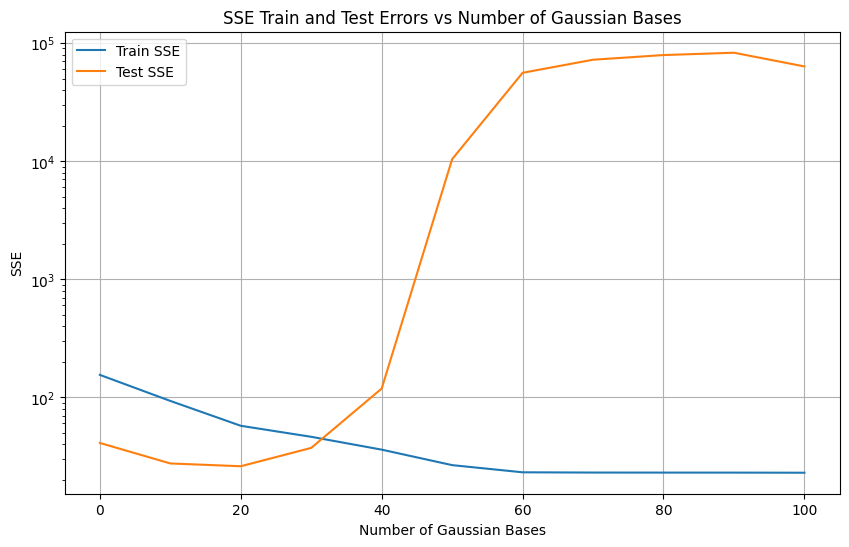

Optimal number of Gaussian basis functions: 20


In [ ]:
# TASK 2 (repeating 10 times)
for rep in range(10):
    x, y_true, y_noisy = generate_data()
    x_train, x_test, y_train, y_test = train_test_split(x, y_noisy, test_size=0.2, random_state=rep)

    train_errors = []
    test_errors = []

    for D in D_values:
        phi_train = create_gaussian_features(x_train, D)
        phi_test = create_gaussian_features(x_test, D)

        model = LinearRegression()
        model.fit(phi_train, y_train)

        y_train_pred = model.predict(phi_train)
        y_test_pred = model.predict(phi_test)

        train_errors.append(compute_sse(y_train, y_train_pred))
        test_errors.append(compute_sse(y_test, y_test_pred))

        phi_full = create_gaussian_features(x, D)
        all_fits[D].append(model.predict(phi_full))

    all_train_errors.append(train_errors)
    all_test_errors.append(test_errors)

# plotting
plt.figure(figsize=(15, 10))
for i, D in enumerate(D_values):
    plt.subplot(3, 4, i+1)
    for fit in all_fits[D]:
        plt.plot(x, fit, 'g-', alpha=0.1)
    plt.plot(x, y_true, 'b-', label='True function')
    plt.plot(x, np.mean(all_fits[D], axis=0), 'r-', label='Average fit')
    plt.title(f'D = {D}')
    if i == 0:
        plt.legend()
plt.tight_layout()
plt.show()

# plotting train & test errors
plt.figure(figsize=(10, 6))
plt.yscale("log")
plt.plot(D_values, np.mean(all_train_errors, axis=0), label='Train SSE')
plt.plot(D_values, np.mean(all_test_errors, axis=0), label='Test SSE')
plt.xlabel('Number of Gaussian Bases')
plt.ylabel('SSE')
plt.title('SSE Train and Test Errors vs Number of Gaussian Bases')
plt.legend()
plt.grid(True)
plt.show()

# optimal num of bases
optimal_D = D_values[np.argmin(np.mean(all_test_errors, axis=0))]
print(f'Optimal number of Gaussian basis functions: {optimal_D}')

## Task 1 & 2 Originality -> Different Synthetic Function + Added Noise ##

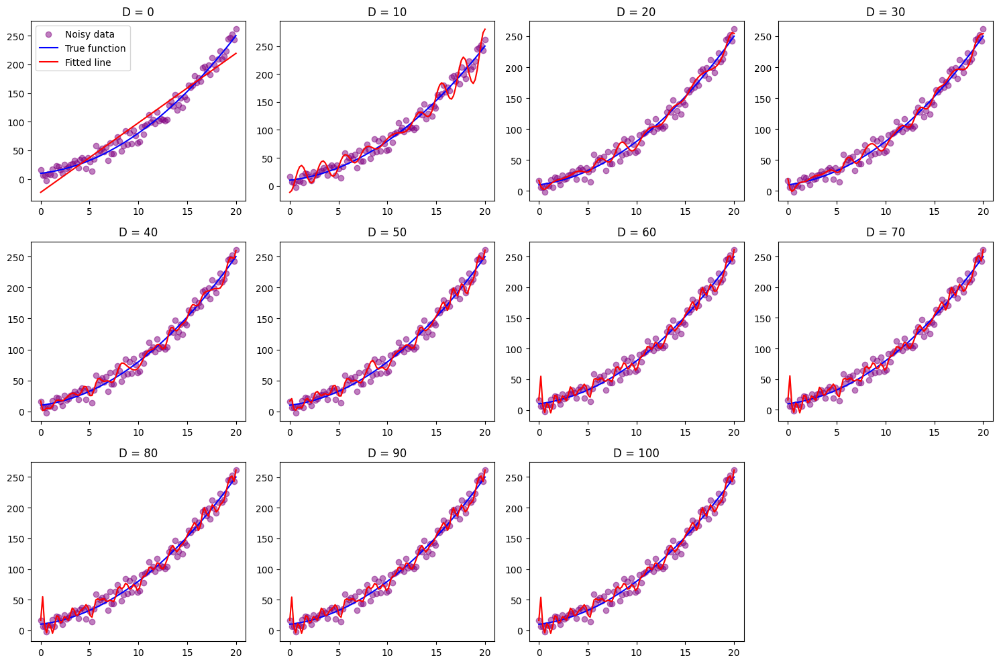

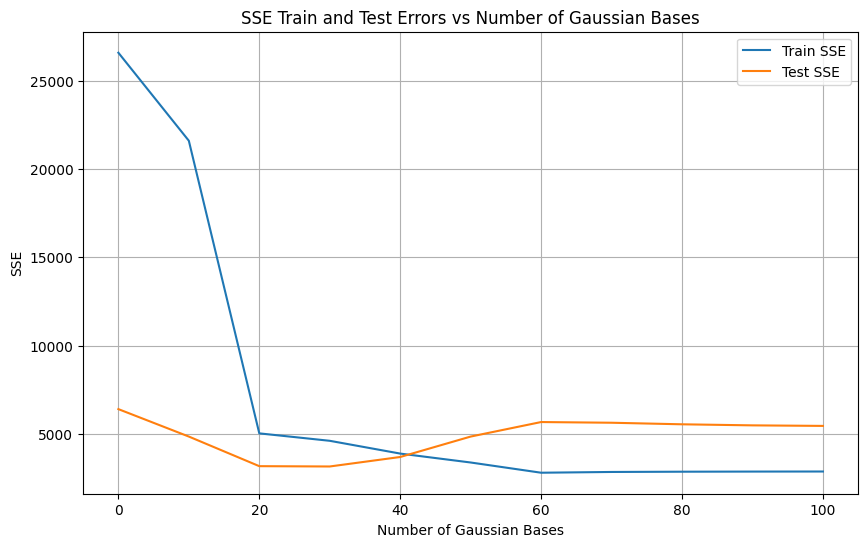

Optimal number of Gaussian basis functions: 30


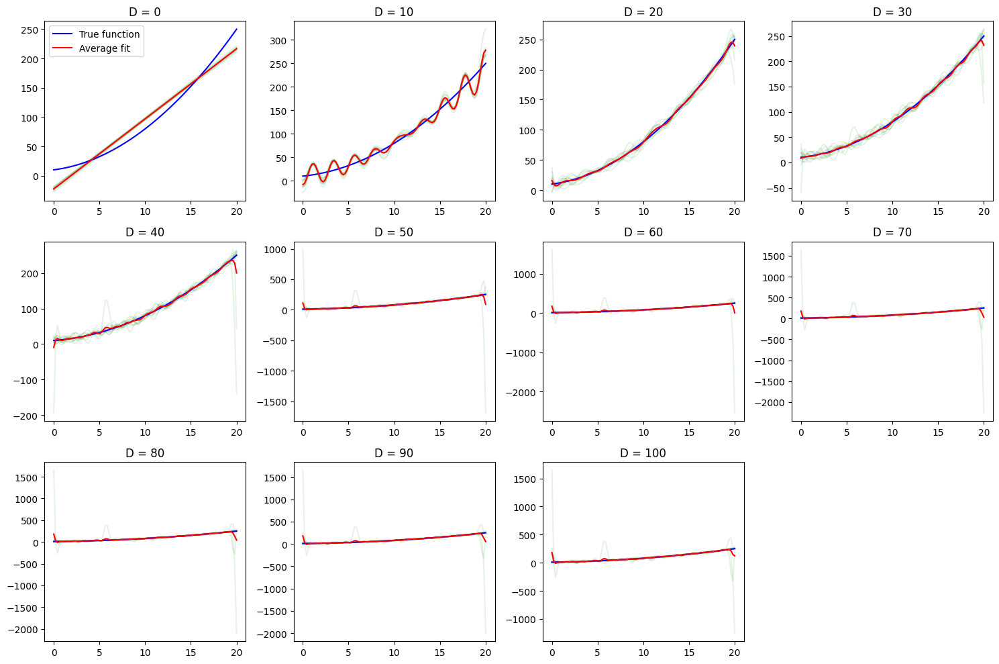

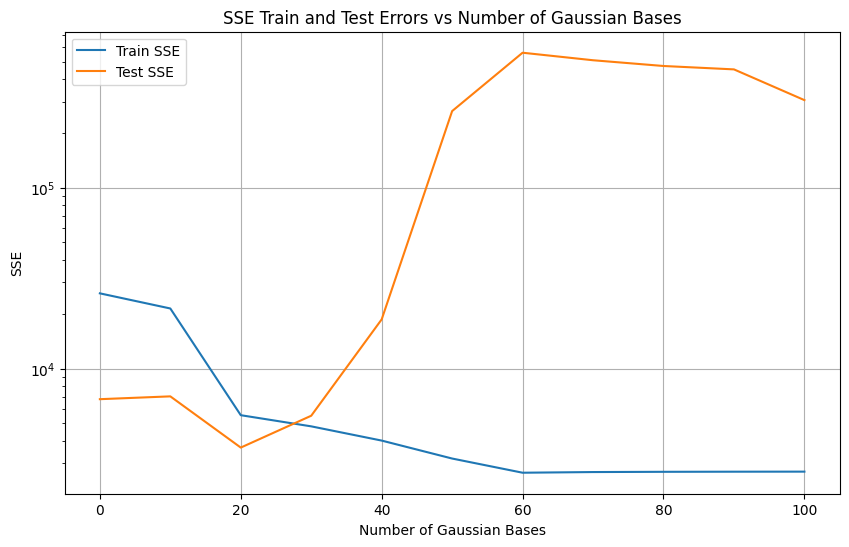

Optimal number of Gaussian basis functions: 20


In [ ]:
def generate_data():
    x = np.linspace(0, 20, 100)
    y = 0.5 * x**2 + 2 * x + 10 # new quadratic synthetic function
    y_noisy = y + np.random.normal(0, 10, 100) #new noise (0 to 10 instead of 0 to 1)
    return x, y, y_noisy

def create_gaussian_features(x, D):
    if D == 0:
        return x[:, None]
    mu = np.linspace(0, 20, D)
    return np.exp(-1 * ((x[:, None] - mu) / 1) ** 2) #sigma stdev of 1

def compute_sse(y_true, y_pred):
    return np.sum((y_true - y_pred) ** 2)

D_values = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
all_train_errors = []
all_test_errors = []
all_fits = {D: [] for D in D_values}

x, y_true, y_noisy = generate_data()
x_train, x_test, y_train, y_test = train_test_split(x, y_noisy, test_size=0.2)

train_errors = []
test_errors = []

for D in D_values: #using 10-100 gaussian bases
        phi_train = create_gaussian_features(x_train, D)
        phi_test = create_gaussian_features(x_test, D)

        model = LinearRegression()
        model.fit(phi_train, y_train)

        y_train_pred = model.predict(phi_train)
        y_test_pred = model.predict(phi_test)

        train_errors.append(compute_sse(y_train, y_train_pred))
        test_errors.append(compute_sse(y_test, y_test_pred))

        #storing full fit for plotting later
        phi_full = create_gaussian_features(x, D)
        all_fits[D].append(model.predict(phi_full))

        all_train_errors.append(train_errors)
        all_test_errors.append(test_errors)

# plotting
plt.figure(figsize=(15, 10))
for i, D in enumerate(D_values):
    plt.subplot(3, 4, i+1)
    plt.scatter(x, y_noisy, alpha=0.5, label='Noisy data', color='purple')
    for fit in all_fits[D]:
        plt.plot(x, fit, 'g-', alpha=0.1)
    plt.plot(x, y_true, 'b-', label='True function')
    plt.plot(x, np.mean(all_fits[D], axis=0), 'r-', label='Fitted line')
    plt.title(f'D = {D}')
    if i == 0:
        plt.legend()
plt.tight_layout()
plt.show()

# plotting train and test errors
plt.figure(figsize=(10, 6))
plt.plot(D_values, np.mean(all_train_errors, axis=0), label='Train SSE')
plt.plot(D_values, np.mean(all_test_errors, axis=0), label='Test SSE')
plt.xlabel('Number of Gaussian Bases')
plt.ylabel('SSE')
plt.title('SSE Train and Test Errors vs Number of Gaussian Bases')
plt.legend()
plt.grid(True)
plt.show()

# optimal number of bases
optimal_D = D_values[np.argmin(np.mean(all_test_errors, axis=0))]
print(f'Optimal number of Gaussian basis functions: {optimal_D}')

# TASK 2 (repeating 10 times)
for rep in range(10):
    x, y_true, y_noisy = generate_data()
    x_train, x_test, y_train, y_test = train_test_split(x, y_noisy, test_size=0.2, random_state=rep)

    train_errors = []
    test_errors = []

    for D in D_values:
        phi_train = create_gaussian_features(x_train, D)
        phi_test = create_gaussian_features(x_test, D)

        model = LinearRegression()
        model.fit(phi_train, y_train)

        y_train_pred = model.predict(phi_train)
        y_test_pred = model.predict(phi_test)

        train_errors.append(compute_sse(y_train, y_train_pred))
        test_errors.append(compute_sse(y_test, y_test_pred))

        phi_full = create_gaussian_features(x, D)
        all_fits[D].append(model.predict(phi_full))

    all_train_errors.append(train_errors)
    all_test_errors.append(test_errors)

# plotting
plt.figure(figsize=(15, 10))
for i, D in enumerate(D_values):
    plt.subplot(3, 4, i+1)
    for fit in all_fits[D]:
        plt.plot(x, fit, 'g-', alpha=0.1)
    plt.plot(x, y_true, 'b-', label='True function')
    plt.plot(x, np.mean(all_fits[D], axis=0), 'r-', label='Average fit')
    plt.title(f'D = {D}')
    if i == 0:
        plt.legend()
plt.tight_layout()
plt.show()

# plotting train & test errors
plt.figure(figsize=(10, 6))
plt.yscale("log")
plt.plot(D_values, np.mean(all_train_errors, axis=0), label='Train SSE')
plt.plot(D_values, np.mean(all_test_errors, axis=0), label='Test SSE')
plt.xlabel('Number of Gaussian Bases')
plt.ylabel('SSE')
plt.title('SSE Train and Test Errors vs Number of Gaussian Bases')
plt.legend()
plt.grid(True)
plt.show()

# optimal num of bases
optimal_D = D_values[np.argmin(np.mean(all_test_errors, axis=0))]
print(f'Optimal number of Gaussian basis functions: {optimal_D}')

# Task 3: Regularization with Cross-Validation

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.utils import check_random_state
from sklearn.metrics import mean_squared_error

In [ ]:
class GradientDescent:

    def __init__(self, learning_rate=.001, max_iters=1e4, epsilon=1e-8, record_history=False):
        self.learning_rate = learning_rate
        self.max_iters = max_iters
        self.record_history = record_history
        self.epsilon = epsilon
        if record_history:
            self.w_history = []                 #to store the weight history for visualization

    def run(self, gradient_fn, x, y, w):
        grad = np.inf
        t = 1
        while np.linalg.norm(grad) > self.epsilon and t < self.max_iters:
            grad = gradient_fn(x, y, w)               # compute the gradient with present weight
            w = w - self.learning_rate * grad         # weight update step
            if self.record_history:
                self.w_history.append(w)
            t += 1
        return w

class LinearRegressionDescent:
    def __init__(self, add_bias=True, regularization=None, reg_strength=0):
        self.add_bias = add_bias
        self.descent = GradientDescent()
        self.regularization = regularization
        self.reg_strength = reg_strength
        pass

    def fit(self, x, y):
        if x.ndim == 1:
            x = x[:, None]
        if self.add_bias:
            N = x.shape[0]
            x = np.column_stack([x,np.ones(N)])
        N,D = x.shape
        def gradient(x, y, w):                          # define the gradient function
            yh =  x @ w
            N, D = x.shape
            grad = .5*np.dot(yh - y, x)/N

            # REGULARIZATION
            if self.regularization == 'L2':
                grad += self.reg_strength * w
            elif self.regularization == 'L1':
                grad += self.reg_strength * np.sign(w)


            return grad
        w0 = np.zeros(D)                                # initialize the weights to 0
        self.w = self.descent.run(gradient, x, y, w0)      # run the optimizer to get the optimal weights
        return self

    def predict(self, x):
        if self.add_bias:
            N = x.shape[0]
            x = np.column_stack([x,np.ones(N)])
        yh = x@self.w
        return yh

**Task 4 - Part 1**

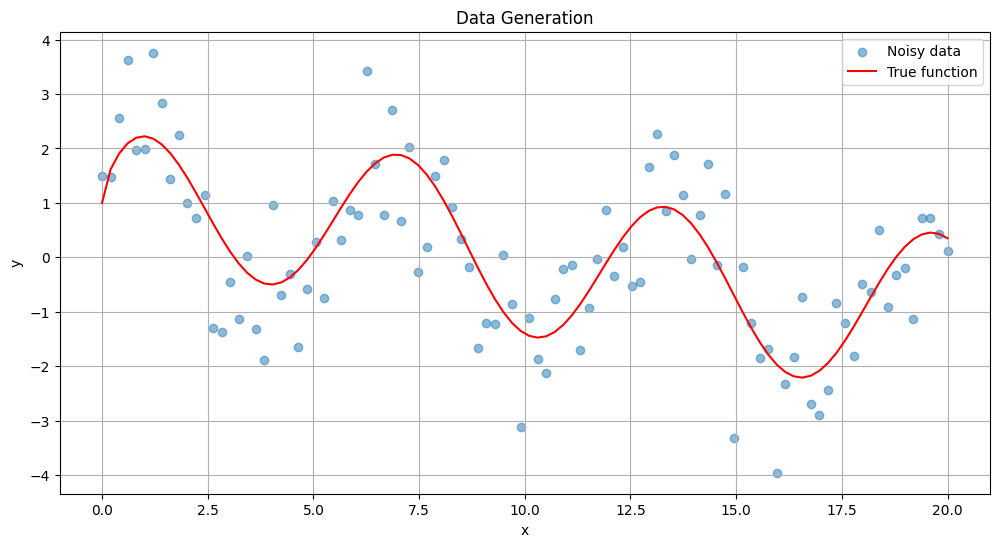

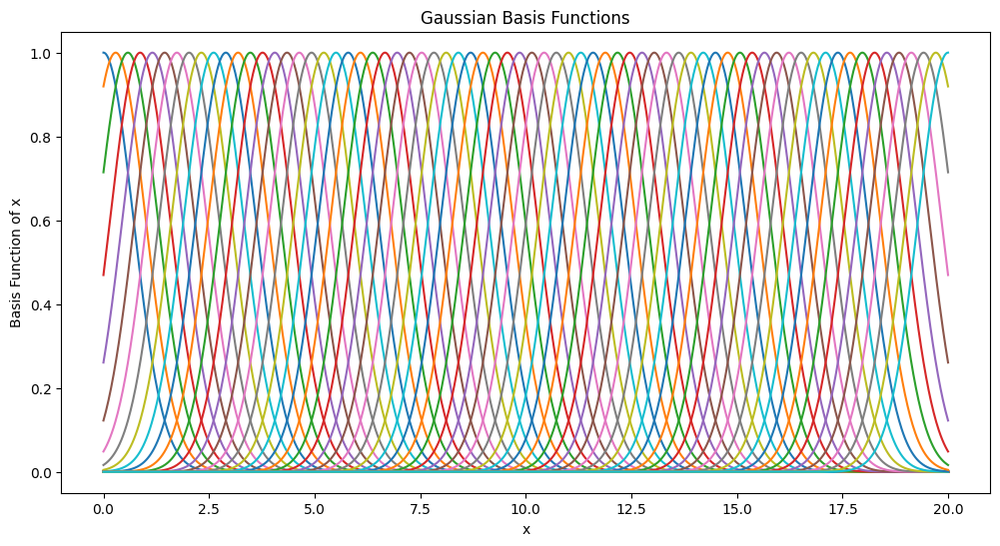

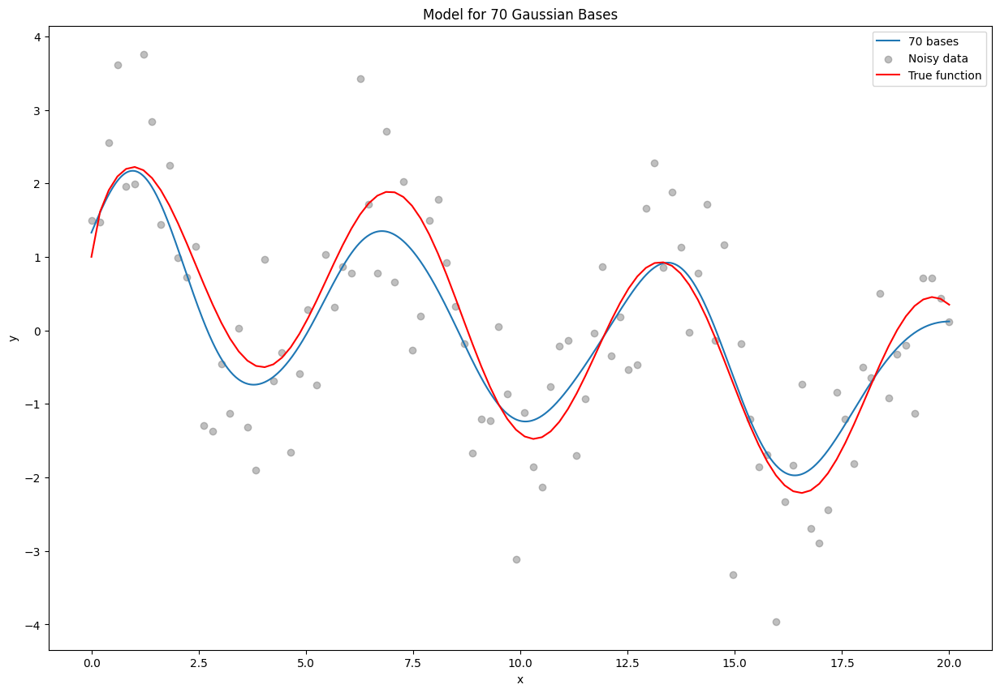

In [ ]:
x = np.linspace(0, 20, 100)
y = np.sin(np.sqrt(x)) + np.cos(x) + np.sin(x)

# add noise
noise = np.random.normal(0, 1, 100)
y_noisy = y + noise

# dataframe for easier plotting
df = pd.DataFrame({'x': x, 'y': y, 'y_noisy': y_noisy})

plt.figure(figsize=(12, 6))
plt.scatter(df['x'], df['y_noisy'], alpha=0.5, label='Noisy data')
plt.plot(df['x'], df['y'], color='red', label='True function')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Data Generation')
plt.legend()
plt.grid(True)
plt.show()

# train and test data split
split_index = int(0.8 * len(x)) # 80/20 train/test split
x_train, x_test = x[:split_index], x[split_index:]
y_train, y_test = y_noisy[:split_index], y_noisy[split_index:]

# non-linear basis function
def gaussian_basis(x, mu, sigma=1):
    return np.exp(-((x - mu) ** 2) / (sigma ** 2))

def create_gaussian_features(x, num_bases):
    if num_bases == 0:
        return x[:, np.newaxis]

    mu_range = np.linspace(x.min(), x.max(), num_bases)
    return np.column_stack([gaussian_basis(x, mu) for mu in mu_range])

# plot the bases
plt.figure(figsize=(12, 6))
x_plot = np.linspace(0, 20, 1000)
for num_bases in [70]:
    features = create_gaussian_features(x_plot, num_bases)
    for i in range(num_bases):
        plt.plot(x_plot, features[:, i])

plt.title('Gaussian Basis Functions')
plt.xlabel('x')
plt.ylabel('Basis Function of x')
plt.show()


num_bases_list = [70]
models = {}

plt.figure(figsize=(15, 10))
for num_bases in num_bases_list:
    features = create_gaussian_features(x, num_bases)
    model = LinearRegressionDescent(add_bias=True, regularization="L2", reg_strength=0.001)
    model.fit(features, y_noisy)
    models[num_bases] = model

    x_plot = np.linspace(0, 20, 1000)
    features_plot = create_gaussian_features(x_plot, num_bases)
    y_pred = model.predict(features_plot)

    plt.plot(x_plot, y_pred, label=f'{num_bases} bases')

plt.scatter(x, y_noisy, alpha=0.5, color='gray', label='Noisy data')
plt.plot(x, y, color='red', label='True function')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Model for 70 Gaussian Bases')
plt.legend()
plt.show()


**Task 4 - Part 2**

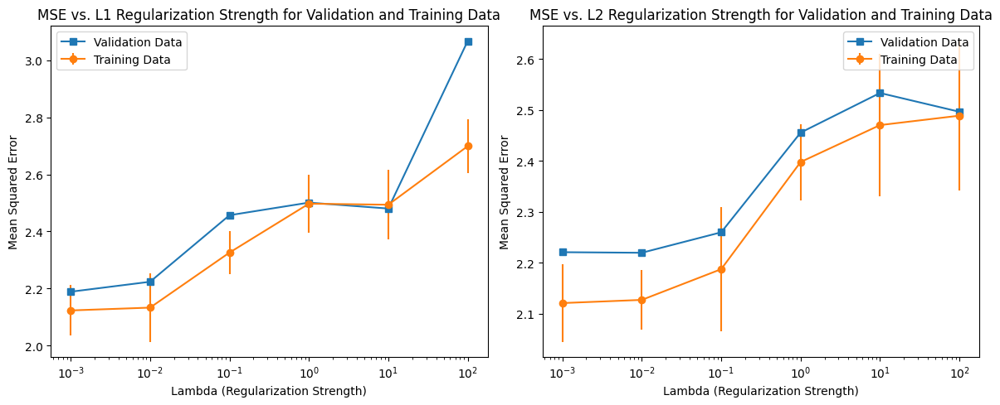

In [ ]:
num_instances = x.shape[0]

# train and test data split
split_index = int(0.8 * len(x)) # 80/20 train/test split
x_train, x_test = x[:split_index], x[split_index:]
y_train, y_test = y_noisy[:split_index], y_noisy[split_index:]

# MSE Loss
loss = lambda y, yh: np.mean((y-yh)**2)

reg_types = ['L1', 'L2']
lambdas = [0.001, 0.01, 0.1, 1, 10, 100]

def cross_validate(n, n_folds=10):
    n_val = n // n_folds # split into 10 folds
    inds = np.random.permutation(n) # take a random permutation of all data
    for f in range(n_folds):
        validation_inds = inds[f * n_val : (f+1) * n_val] # extract validation indices
        training_inds = np.concatenate([inds[:f * n_val], inds[(f+1) * n_val:]]) # extract test indices
        yield training_inds, validation_inds # yield the training indices and validation indices for the current cross validation split


num_folds = 10

# initialize array to store MSEs for training and validation data
results = []

for reg_type in reg_types: # for L1 and L2
    for l in lambdas: # for each lambda value
        training_errors, validation_errors = [], []
        for training_inds, validation_inds in cross_validate(len(x_train), num_folds): # for each of the ten folds
            model = LinearRegressionDescent(add_bias=True, regularization=reg_type, reg_strength=l)
            model = model.fit(x_train[training_inds], y_train[training_inds]) # fit the model using the training set

            train_pred = model.predict(x_train[training_inds])
            val_pred = model.predict(x_train[validation_inds])

            training_errors.append(loss(y_train[training_inds], train_pred)) # store training error for each fold
            validation_errors.append(loss(y_train[validation_inds], val_pred)) # store validation error for each fold

        results.append({
            'regularization': reg_type,
            'lambda': l,
            'training_mse': np.mean(training_errors), # store the mean of all training errors for this lambda
            'training_mse_std': np.std(training_errors),
            'validation_mse': np.mean(validation_errors), # store the mean of all validation errors for this lambda
        })



import pandas as pd
results_df = pd.DataFrame(results)

plt.figure(figsize=(12, 5))

for reg_type in reg_types:
    df = results_df[results_df['regularization'] == reg_type]

    plt.subplot(1, 2, reg_types.index(reg_type) + 1)
    plt.errorbar(df['lambda'], df['validation_mse'], label='Validation Data', marker='s')
    plt.errorbar(df['lambda'], df['training_mse'], yerr=df['training_mse_std'], label='Training Data', marker='o')


    plt.xscale('log')
    plt.title(f'MSE vs. {reg_type} Regularization Strength for Validation and Training Data')
    plt.xlabel('Lambda (Regularization Strength)')
    plt.ylabel('Mean Squared Error')
    plt.legend()

plt.tight_layout()
plt.show()





**Task 3 - Part 3**

In [ ]:
num_datasets = 50 # datasets
num_samples = 20 # sample 20 points from each dataset
lambdas = np.logspace(-4, 2, 15)
num_folds = 10
reg_types = ['L1', 'L2']

# initialize array to store the results from all datasets and folds
all_results = []

# take num_samples samples from each of the num_datasets datasets
for dataset_index in range(num_datasets):
    inds = np.random.choice(len(x_train), num_samples, False) # sampling without replacement
    x, y = x_train[inds], y_train[inds]

    for reg_type in reg_types: # for L1 and L2
        for l in lambdas: # for each lambda value
            training_errors, validation_errors = [], []

            # cross validation
            for training_inds, validation_inds in cross_validate(len(x), num_folds):
                model = LinearRegressionDescent(add_bias=True, regularization=reg_type, reg_strength=l)
                model.fit(x[training_inds], y[training_inds])

                train_pred = model.predict(x[training_inds])
                val_pred = model.predict(x[validation_inds])

                # mse calculation for training data and validation data
                training_errors.append(loss(y[training_inds], train_pred))
                validation_errors.append(loss(y[validation_inds], val_pred))

            all_results.append({
                'dataset': dataset_index,
                'regularization': reg_type,
                'lambda': l,
                'training_mse': np.mean(training_errors),
                'training_mse_std': np.std(training_errors),
                'validation_mse': np.mean(validation_errors),
            })

# store results in a dataframe for when we plot
results_df = pd.DataFrame(all_results)

plt.figure(figsize=(12, 6))

for reg_type in reg_types:
    df = results_df[results_df['regularization'] == reg_type]

    plt.subplot(1, 2, reg_types.index(reg_type) + 1)

    # for every lambda
    lambda_data = df.groupby('lambda').agg(
        # we aggregate training and validation error values from all 50 datasets and each of the 10 folds of cross validation

        # record aggregated mean and standard deviation of all training and validation errors recorded
        mean_validation_mse=('validation_mse', 'mean'),
        std_validation_mse=('validation_mse', 'std'),
        mean_training_mse=('training_mse', 'mean'),
        std_training_mse=('training_mse', 'std')
    # keep lambda values as columns in the dataframe, do not collapse into a single index
    ).reset_index()

    # plot with errorbars based on calculated standard deviation
    plt.errorbar(lambda_data['lambda'], lambda_data['mean_validation_mse'], yerr=lambda_data['std_validation_mse'], label='Validation MSE', marker='s')
    plt.errorbar(lambda_data['lambda'], lambda_data['mean_training_mse'], yerr=lambda_data['std_training_mse'], label='Training MSE', marker='o')

    plt.xscale('log')
    plt.title(f'MSE vs. {reg_type} Regularization Strength (Lambda)')
    plt.xlabel('Lambda (Regularization Strength)')
    plt.ylabel('Mean Squared Error')
    plt.legend()

plt.tight_layout()
plt.show()


**Task 3 - Part 4**

In [ ]:
noise_variance=1.0

# initialize storage for predictions using a standard nested dictionary
predictions_per_lambda = {}  # store predictions for each (reg_type, lambda)

# same loop as in part 3, but now we store bias and variance data
for dataset_index in range(num_datasets):
    inds = np.random.choice(len(x_train), num_samples, False)
    x, y = x_train[inds], y_train[inds]

    for reg_type in reg_types:
        for l in lambdas:

            model = LinearRegressionDescent(add_bias=True, regularization=reg_type, reg_strength=l)
            model.fit(x, y)
            y_pred = model.predict(x_test)

            # initialize the prediction array for each lambda if it doesn't already exist
            # use a tuple storing regularization type and lambda value as key
            if (reg_type, l) not in predictions_per_lambda:
                predictions_per_lambda[(reg_type, l)] = []

            # store the predictions for this lambda and regularization type
            predictions_per_lambda[(reg_type, l)].append(y_pred)

# initialize array to store bias and variance calculations
bias_variance_results = []

for (reg_type, lam), preds in predictions_per_lambda.items():
    # convert predictions to a numpy array so we can calculate bias and variance easier
    preds = np.array(preds)  # num_datasets x num_test_samples
    avg_prediction = np.mean(preds, axis=0)  # take the mean across the datasets

    # bias^2 = (mean of predictions - true value)^2
    bias_squared = np.mean((avg_prediction - y_test) ** 2)

    # vairance = variance of the predictions across all datasets
    squared_diffs = (preds - avg_prediction) ** 2  # take squared differences for all elements in the preds array
    variance_per_sample = np.mean(squared_diffs, axis=0)  # mean squared difference per sample

    # overall mean variance across all test samples of each dataset
    variance = np.mean(variance_per_sample)

    bias_variance_results.append({
        'regularization': reg_type,
        'lambda': lam,
        'bias_squared': bias_squared,
        'variance': variance,
        'bias_variance_sum': bias_squared + variance,
        'total_error': bias_squared + variance + noise_variance # add noise variance
    })

# store results in a dataframe for when we plot
bias_variance_df = pd.DataFrame(bias_variance_results)

plt.figure(figsize=(12, 6))

for reg_type in reg_types:
    df = bias_variance_df[bias_variance_df['regularization'] == reg_type]

    plt.subplot(1, 2, reg_types.index(reg_type) + 1)

    # bias^2, variance, sum, sum with noise
    plt.plot(df['lambda'], df['bias_squared'], label='Bias²', marker='o')
    plt.plot(df['lambda'], df['variance'], label='Variance', marker='s')
    plt.plot(df['lambda'], df['bias_variance_sum'], label='Bias² + Variance', marker='^')
    plt.plot(df['lambda'], df['total_error'], label='Bias² + Variance + Noise', marker='x')

    plt.xscale('log')
    plt.xlabel('Lambda (Regularization Strength)')
    plt.ylabel('Error')
    plt.title(f'Bias-Variance Decomposition for {reg_type} Regularization')
    plt.legend()

plt.tight_layout()
plt.show()


**Creativy** - Added K-Fold

In [ ]:
noise_variance=1.0

predictions_per_lambda = {}  # store predictions for each (reg_type, lambda)

# same loop as in part 3, but now we store bias and variance data
for dataset_index in range(num_datasets):
    inds = np.random.choice(len(x_train), num_samples, False)
    x, y = x_train[inds], y_train[inds]

    for reg_type in reg_types:
        for l in lambdas:

            fold_predictions = []  # Store predictions for each fold

            # cross validation
            for train_inds, val_inds in cross_validate(len(x), num_folds):
                model = LinearRegressionDescent(add_bias=True, regularization=reg_type, reg_strength=l)
                model.fit(x[train_inds], y[train_inds])

                # Predict on the validation fold and store the result
                fold_pred = model.predict(x_test)  # Predict on the test data
                fold_predictions.append(fold_pred)

            # initialize the prediction array for each lambda if it doesn't already exist
            # use a tuple storing regularization type and lambda value as key
            if (reg_type, l) not in predictions_per_lambda:
                predictions_per_lambda[(reg_type, l)] = []

            # store the average prediction across all folds for this lambda and regularization type
            avg_fold_prediction = np.mean(fold_predictions, axis=0)
            predictions_per_lambda[(reg_type, l)].append(avg_fold_prediction)

# initialize array to store bias and variance calculations
bias_variance_results = []

for (reg_type, lam), preds in predictions_per_lambda.items():
    # convert predictions to a numpy array so we can calculate bias and variance easier
    preds = np.array(preds)  # num_datasets x num_test_samples
    avg_prediction = np.mean(preds, axis=0)  # take the mean across the datasets

    # bias^2 = (mean of predictions - true value)^2
    bias_squared = np.mean((avg_prediction - y_test) ** 2)

    # vairance = variance of the predictions across all datasets
    squared_diffs = (preds - avg_prediction) ** 2  # take squared differences for all elements in the preds array
    variance_per_sample = np.mean(squared_diffs, axis=0)  # mean squared difference per sample

    # overall mean variance across all test samples of each dataset
    variance = np.mean(variance_per_sample)

    bias_variance_results.append({
        'regularization': reg_type,
        'lambda': lam,
        'bias_squared': bias_squared,
        'variance': variance,
        'bias_variance_sum': bias_squared + variance,
        'total_error': bias_squared + variance + noise_variance # add noise variance
    })

# store results in a dataframe for when we plot
bias_variance_df = pd.DataFrame(bias_variance_results)

plt.figure(figsize=(12, 6))

for reg_type in reg_types:
    df = bias_variance_df[bias_variance_df['regularization'] == reg_type]

    plt.subplot(1, 2, reg_types.index(reg_type) + 1)

    # bias^2, variance, sum, sum with noise
    plt.plot(df['lambda'], df['bias_squared'], label='Bias²', marker='o')
    plt.plot(df['lambda'], df['variance'], label='Variance', marker='s')
    plt.plot(df['lambda'], df['bias_variance_sum'], label='Bias² + Variance', marker='^')
    plt.plot(df['lambda'], df['total_error'], label='Bias² + Variance + Noise', marker='x')

    plt.xscale('log')
    plt.xlabel('Lambda (Regularization Strength)')
    plt.ylabel('Error')
    plt.title(f'Bias-Variance Decomposition for {reg_type} Regularization')
    plt.legend()

plt.tight_layout()
plt.show()


# Task 4 - Effect of L1 and L2 Regularization on Loss

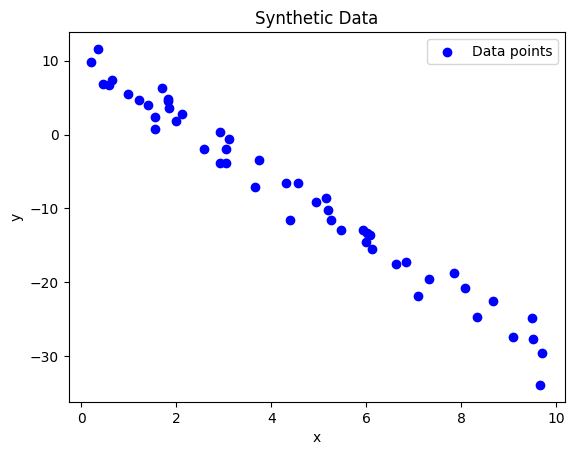

In [ ]:
# 1 Generating Synthetic Data

np.random.seed(42)
x = np.random.uniform(0, 10, 50) # distrubted between 0 and 10
epsilon = np.random.normal(0, 1, 50) # mean 0 and variance 1, 50 points

y = -4*x + 10 + 2*epsilon

# scatterplot
plt.scatter(x, y, color='blue', label='Data points')
plt.title('Synthetic Data')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

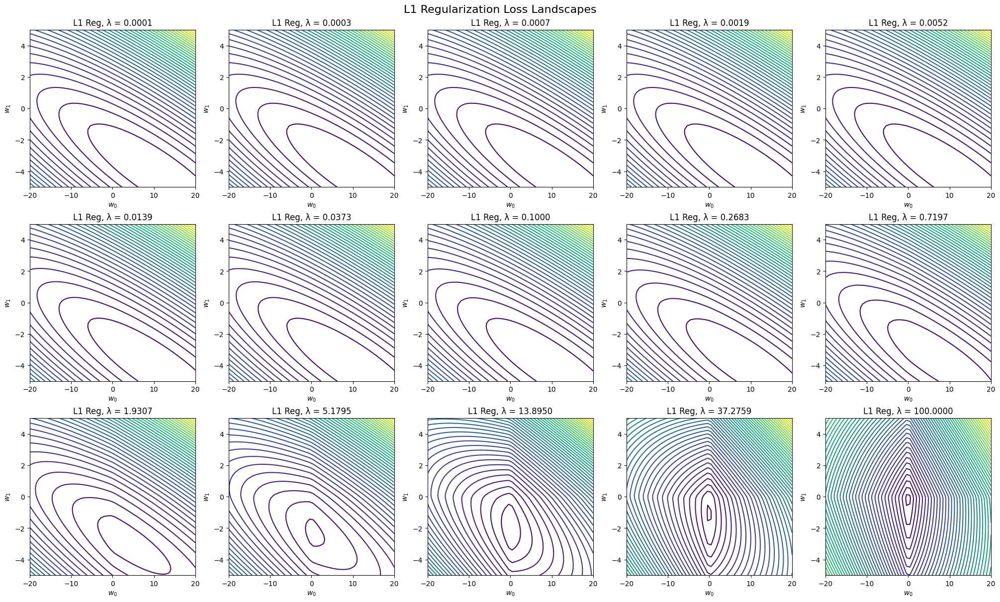

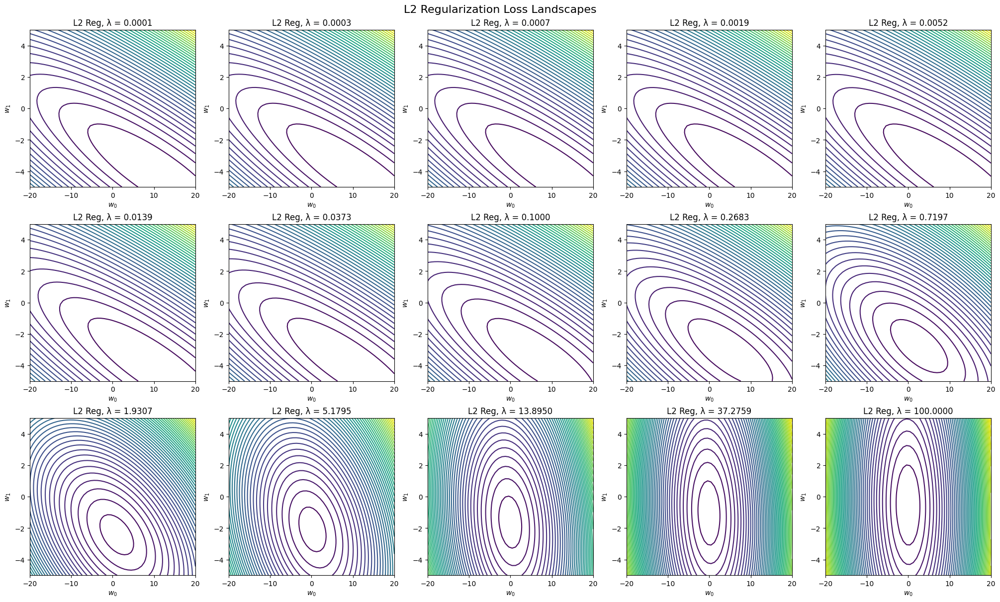

In [ ]:
# 3 -4

def plot_contour(f, x1bound, x2bound, resolution, ax):
    x1range = np.linspace(x1bound[0], x1bound[1], resolution)
    x2range = np.linspace(x2bound[0], x2bound[1], resolution)
    xg, yg = np.meshgrid(x1range, x2range)
    zg = np.zeros_like(xg)
    for i,j in itertools.product(range(resolution), range(resolution)):
        zg[i,j] = f([xg[i,j], yg[i,j]])
    ax.contour(xg, yg, zg, 100)
    return ax

cost = lambda w: 0.5 * np.mean((w[0] + w[1] * x - y) ** 2)
l1_penalty = lambda w: np.sum(np.abs(w))
l2_penalty = lambda w: np.dot(w, w) / 2

def cost_plus_l1(w, reg):
    """Combines the cost function with L1 regularization."""
    return cost(w) + reg * l1_penalty(w)

def cost_plus_l2(w, reg):
    """Combines the cost function with L2 regularization."""
    return cost(w) + reg * l2_penalty(w)

def plot_contour(f, x1bound, x2bound, resolution, ax):
    x1range = np.linspace(x1bound[0], x1bound[1], resolution)
    x2range = np.linspace(x2bound[0], x2bound[1], resolution)
    xg, yg = np.meshgrid(x1range, x2range)
    zg = np.zeros_like(xg)

    for i, j in itertools.product(range(resolution), range(resolution)):
        zg[i, j] = f([xg[i, j], yg[i, j]])

    ax.contour(xg, yg, zg, 50)
    return ax

reg_list = np.logspace(-4, 2, 15)

# l1 reg
fig, axes = plt.subplots(3, 5, figsize=(20, 12), constrained_layout=True)
for i, (reg_coef, ax) in enumerate(zip(reg_list, axes.flat)):
    f = lambda w: cost_plus_l1(w, reg_coef)
    plot_contour(f, [-20, 20], [-5, 5], 50, ax)
    ax.set_title(f'L1 Reg, λ = {reg_coef:.4f}')
    ax.set_xlabel(r'$w_0$')
    ax.set_ylabel(r'$w_1$')
plt.suptitle('L1 Regularization Loss Landscapes', fontsize=16)
plt.show()

# l2 reg
fig, axes = plt.subplots(3, 5, figsize=(20, 12), constrained_layout=True)
for i, (reg_coef, ax) in enumerate(zip(reg_list, axes.flat)):
    f = lambda w: cost_plus_l2(w, reg_coef)
    plot_contour(f, [-20, 20], [-5, 5], 50, ax)
    ax.set_title(f'L2 Reg, λ = {reg_coef:.4f}')
    ax.set_xlabel(r'$w_0$')
    ax.set_ylabel(r'$w_1$')
plt.suptitle('L2 Regularization Loss Landscapes', fontsize=16)
plt.show()


In [ ]:
# linear regression and gradient descent

class GradientDescent:

    def __init__(self, learning_rate=.001, max_iters=1e4, epsilon=1e-8, record_history=False):
        self.learning_rate = learning_rate
        self.max_iters = max_iters
        self.record_history = record_history
        self.epsilon = epsilon
        if record_history:
            self.w_history = []

    def run(self, gradient_fn, x, y, w):
        grad = np.inf
        t = 1
        while np.linalg.norm(grad) > self.epsilon and t < self.max_iters:
            grad = gradient_fn(x, y, w)
            w = w - self.learning_rate * grad
            if self.record_history:
                self.w_history.append(w)
            t += 1
        return w

class LinearRegression:
    def __init__(self, add_bias=True, l2_reg=0, l1_reg=0):
        self.add_bias = add_bias
        self.l2_reg = l2_reg
        self.l1_reg = l1_reg

    def fit(self, x, y, optimizer):
        if x.ndim == 1:
            x = x[:, None]
        if self.add_bias:
            N = x.shape[0]
            x = np.column_stack([x, np.ones(N)])
        N, D = x.shape

        def gradient(x, y, w):
            yh =  x @ w
            grad = np.dot(x.T, (yh - y)) / N
            # l2 reg
            grad += self.l2_reg * w
            # l1 reg
            grad += self.l1_reg * np.sign(w)
            return grad

        w0 = np.zeros(D)
        self.w = optimizer.run(gradient, x, y, w0)
        return self

    def predict(self, x):
        if self.add_bias:
            N = x.shape[0]
            x = np.column_stack([x, np.ones(N)])
        yh = x @ self.w
        return yh


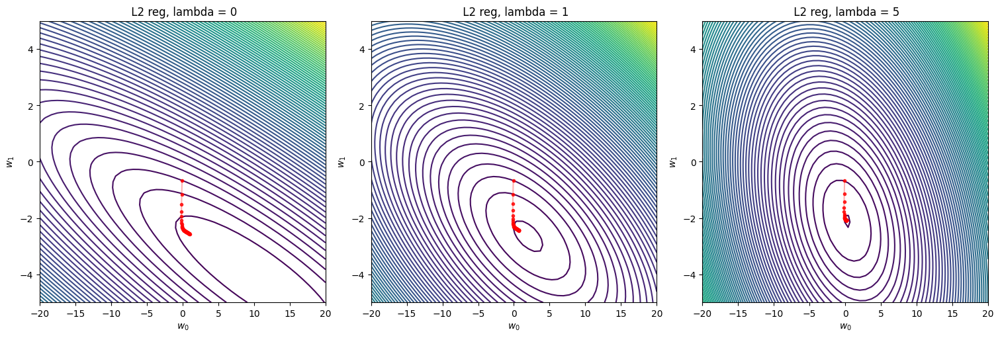

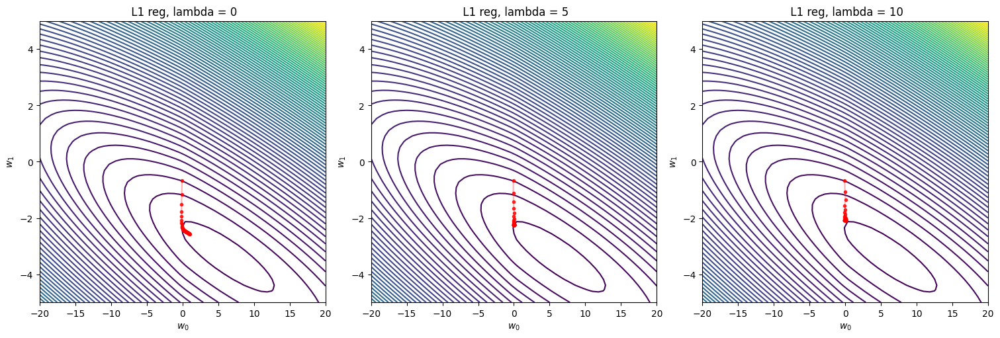

In [ ]:
# 4 Visualizing Gradient Descent

costl2 = lambda w, reg: .5*np.mean((w[0] + w[1]*x - y)**2) + reg*np.dot(w,w)/2
reg_list = [0, 1, 5]
fig, axes = plt.subplots(ncols=len(reg_list), nrows=1, constrained_layout=True, figsize=(15, 5))
for i, reg_coef in enumerate(reg_list):
    optimizer = GradientDescent(learning_rate=.01, max_iters=50, record_history=True)
    model = LinearRegression(optimizer, l2_reg=reg_coef)
    model.fit(x,y, optimizer)
    current_cost = lambda w: costl2(w, reg_coef)
    plot_contour(current_cost, [-20,20], [-5,5], 50, axes[i])
    w_hist = np.vstack(optimizer.w_history)
    axes[i].plot(w_hist[:,1], w_hist[:,0], '.r', alpha=.8)
    axes[i].plot(w_hist[:,1], w_hist[:,0], '-r', alpha=.3)
    axes[i].set_xlabel(r'$w_0$')
    axes[i].set_ylabel(r'$w_1$')
    axes[i].set_title(f' L2 reg, lambda = {reg_coef}')
    axes[i].set_xlim([-20,20])
    axes[i].set_ylim([-5,5])

costl1 = lambda w, reg: .5*np.mean((w[0] + w[1]*x - y)**2) + np.sum(np.abs(w))
reg_list = [0, 5, 10]
fig, axes = plt.subplots(ncols=len(reg_list), nrows=1, constrained_layout=True, figsize=(15, 5))
for i, reg_coef in enumerate(reg_list):
    optimizer = GradientDescent(learning_rate=.01, max_iters=50, record_history=True)
    model = LinearRegression(optimizer, l1_reg=reg_coef)
    model.fit(x,y, optimizer)
    current_cost = lambda w: costl1(w, reg_coef)
    plot_contour(current_cost, [-20,20], [-5,5], 50, axes[i])
    w_hist = np.vstack(optimizer.w_history)
    axes[i].plot(w_hist[:,1], w_hist[:,0], '.r', alpha=.8)
    axes[i].plot(w_hist[:,1], w_hist[:,0], '-r', alpha=.3)
    axes[i].set_xlabel(r'$w_0$')
    axes[i].set_ylabel(r'$w_1$')
    axes[i].set_title(f' L1 reg, lambda = {reg_coef}')
    axes[i].set_xlim([-20,20])
    axes[i].set_ylim([-5,5])
